# Analysis of two-locus sweep-with-gene-conversion simulation outcomes
This notebook reads in the results of our SLiM simulations and then calculates the fraction of pseudo-soft sweeps and other related outcomes for each parameter combination for each simulation model.
 
First, we define a function to read in the data generated by the `parseOutputForSpecies.py` script at the end of the pipeline described in this repository's README, and calculate the mean value of our target simulation outcomes across all replicates for a given parameter combination (each of which has its own summary file generated by `parseOutputForSpecies.py`.

Note: if you did not write out all of your simulation results to the default directories in this pipeline (i.e. if you changed what I had hard-coded into the python scripts), then you will have to change initialization line for `summaryOutDir` below to have it point to where you wrote the output from the `parseOutputForSpecies.py` step.

In [1]:
import os
import numpy as np
import scipy.stats

summaryOutDir = "slimResultSummaries/"

def parseSummaryResults(summaryFileName):
    totalReps, goodReps, fixedCount, partialCount, sweepingMutAbsentFromSamp = 0, 0, 0, 0, 0
    fixedSoftCount, fixedSoftCount, fixedSoftSampCount, partialSoftSampCount = 0, 0, 0, 0
    m3FreqsPop, m3FreqsSamp, m3PartialFreqs, partialSweepFreqs = [], [], [], []
    #print(summaryFileName)
    with open(summaryFileName, 'rt') as sf:
        for line in sf:
            #print(line)
            repNum, isGoodRep, isFixed, isFixedSoftPop, m3freqPop, isFixedSoftSamp, m3CountSamp, n, isPartialSoftSamp, \
            m3PartialCountSamp, m3PartialDenomSamp, sojournTime, restartCount = line.strip().split()
            if isGoodRep == "1":
                goodReps += 1
                if isFixed == "1":
                    
                    if int(isFixedSoftPop):
                        m3FreqsPop.append(float(m3freqPop))
                    if int(isFixedSoftSamp):
                        m3Freq = int(m3CountSamp)/int(n) #TODO: gotta go check my parser code to see if this is right
                        #m3FreqsSamp.append(m3Freq if m3Freq < 0.5 else 1-m3Freq)
                        m3FreqsSamp.append(m3Freq)
                    fixedCount += 1
                    fixedSoftCount += int(isFixedSoftPop)
                    fixedSoftSampCount += int(isFixedSoftSamp)
                    #print(line.strip().split(), [isFixed])
                else:
                    m3PartialCountSamp, m3PartialDenomSamp = int(m3PartialCountSamp), int(m3PartialDenomSamp)
                    if m3PartialDenomSamp == 0:
                        sweepingMutAbsentFromSamp += 1
                    else:
                        partialCount += 1
                        if int(isPartialSoftSamp):
                            m3PartialFreq = m3PartialCountSamp/m3PartialDenomSamp
                            #m3PartialFreqs.append(m3PartialFreq if m3PartialFreq < 0.5 else 1-m3PartialFreq)
                            m3PartialFreqs.append(m3PartialFreq)
                            partialSoftSampCount += 1
                    partialSweepFreqs.append(m3PartialDenomSamp / int(n))
            totalReps += 1
                        
    goodRepFrac = goodReps/totalReps
    if partialCount == 0:
        partialSoftSampFrac = "NA"
    else:
        partialSoftSampFrac = partialSoftSampCount / partialCount
    if fixedCount == 0:
        fixedSoftFrac = "NA"
        fixedSoftSampFrac = "NA"
    else:
        fixedSoftFrac = fixedSoftCount / fixedCount
        fixedSoftSampFrac = fixedSoftSampCount / fixedCount

    popMean = np.mean(m3FreqsPop) if m3FreqsPop else "NA"
    sampMean = np.mean(m3FreqsSamp) if m3FreqsSamp else "NA"
    partialMean = np.mean(m3PartialFreqs) if m3PartialFreqs else "NA"
    totalSampMean = np.mean(m3FreqsSamp+m3PartialFreqs) if m3FreqsSamp+m3PartialFreqs else "NA"
    sampMeanSEM = scipy.stats.sem(m3FreqsSamp+m3PartialFreqs) if m3FreqsSamp+m3PartialFreqs else "NA"
    fixedFrac = fixedCount/goodReps if goodReps else "NA"
    partialFrac = partialCount/goodReps if goodReps else "NA"
    partialSweepMean = np.mean(partialSweepFreqs) if partialSweepFreqs else "NA"
    sweepingMutAbsentFromSampFrac = sweepingMutAbsentFromSamp/goodReps if goodReps else "NA"
        
    return (goodRepFrac, fixedFrac, partialFrac, sweepingMutAbsentFromSampFrac, popMean, fixedSoftFrac, sampMean, fixedSoftSampFrac,\
            partialMean, totalSampMean, sampMeanSEM, partialSoftSampFrac, partialSweepMean)

With that function ready to rock, we can now read in the simulation outcome summary file for each parameter combination. For each demographic model simulated for each species, we create a `pandas` dataframe that we will use to generate our final figures. We show these tables below, and they are pretty big, so you have to scroll way down to get to our next piece of code where we get to the plotting.

In [2]:
import pandas as pd

columns = "Species,Demog Model,Selection Coefficient,Dominance Coefficient,Sweep Start Time,Gene Conversion Ratio"
columns += ",Good Rep %,Fixed %,Partial %,Sweeping mut absent from samp%,Mean Recombinant Pop Freq (fixed),Fraction Soft in Pop (fixed)"
columns += ",Mean Recombinant Sample Freq (fixed),Fraction Soft in Sample (fixed),Mean Recombinant Sample Freq (incomplete),Mean Rec Sample Freq (all)"
columns += ",SEM Rec Sample Freq (all),Fraction Soft in Sample (incomplete),Mean Sweep Freq in Sample (incomplete)"
columns = columns.split(",")

allResults = {}
for fName in os.listdir(summaryOutDir):
    #print(fName)
#for fName in [x for x in os.listdir(summaryOutDir) if x == "HomSap-OutOfAfrica_2T12-flat-chr12-AFR-0-200-10-0.1-0.5-0.01-1.txt"]:
    specName, demogModel, mapName, contigName, targetPop, popNumber, sampleSize, Q, selCoeff, domCoeff, selTime, \
    geneConvRatio = fName.rstrip(".txt").split("-")

    results = [specName, demogModel, float(selCoeff), float(domCoeff), float(selTime), float(geneConvRatio)]
    #if selTime == '0.01' and selCoeff == '0.001' and specName == "HomSap" and domCoeff == '0.0' and geneConvRatio == '1':
    results += parseSummaryResults(summaryOutDir + "/" + fName)
    if not (specName,demogModel,targetPop) in allResults:
        allResults[(specName,demogModel,targetPop)] = []
    allResults[(specName,demogModel,targetPop)].append(results)

pd.options.display.max_rows = 999
tables = {}
for specName, demogModel, targetPop in sorted(allResults):
    print(specName, demogModel, targetPop)
    table = pd.DataFrame(allResults[(specName,demogModel,targetPop)], columns=columns)
    tableFileName = f"bigTables/{specName}.{demogModel}.{targetPop}.tsv"
    table.to_csv(tableFileName, sep='\t')
    tables[(specName, demogModel, targetPop)] = table
    display(table.sort_values(
        by = ['Gene Conversion Ratio', 'Sweep Start Time', 'Selection Coefficient', 'Dominance Coefficient'],
        ascending = [True, True, True, True]).fillna("NA"))

/nas/longleaf/rhel9/apps/anaconda/2024.02.ood/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/nas/longleaf/rhel9/apps/anaconda/2024.02.ood/lib/python3.11/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


AraTha African3Epoch_1H18 SouthMiddleAtlas


,Species,Demog Model,Selection Coefficient,Dominance Coefficient,Sweep Start Time,Gene Conversion Ratio,Good Rep %,Fixed %,Partial %,Sweeping mut absent from samp%,Mean Recombinant Pop Freq (fixed),Fraction Soft in Pop (fixed),Mean Recombinant Sample Freq (fixed),Fraction Soft in Sample (fixed),Mean Recombinant Sample Freq (incomplete),Mean Rec Sample Freq (all),SEM Rec Sample Freq (all),Fraction Soft in Sample (incomplete),Mean Sweep Freq in Sample (incomplete)
0,AraTha,African3Epoch_1H18,0.001,0.0,0.01,0.0,1.000,0.000000,0.644000,0.356000,NA,NA,NA,NA,NA,NA,NA,0.0,0.00837
25,AraTha,African3Epoch_1H18,0.001,0.5,0.01,0.0,1.000,0.000000,0.932000,0.068000,NA,NA,NA,NA,NA,NA,NA,0.0,0.054495
50,AraTha,African3Epoch_1H18,0.001,1.0,0.01,0.0,1.000,0.000000,0.993000,0.007000,NA,NA,NA,NA,NA,NA,NA,0.0,0.269705
75,AraTha,African3Epoch_1H18,0.010,0.0,0.01,0.0,1.000,0.000000,0.681000,0.319000,NA,NA,NA,NA,NA,NA,NA,0.0,0.02124
100,AraTha,African3Epoch_1H18,0.010,0.5,0.01,0.0,1.000,1.000000,0.000000,0.000000,NA,0.0,NA,0.0,NA,NA,NA,NA,NA
125,AraTha,African3Epoch_1H18,0.010,1.0,0.01,0.0,1.000,0.000000,1.000000,0.000000,NA,NA,NA,NA,NA,NA,NA,0.0,0.97946
150,AraTha,African3Epoch_1H18,0.100,0.0,0.01,0.0,1.000,0.856000,0.088000,0.056000,NA,0.0,NA,0.0,NA,NA,NA,0.0,0.051597
175,AraTha,African3Epoch_1H18,0.100,0.5,0.01,0.0,1.000,1.000000,0.000000,0.000000,NA,0.0,NA,0.0,NA,NA,NA,NA,NA
200,AraTha,African3Epoch_1H18,0.100,1.0,0.01,0.0,1.000,0.405000,0.595000,0.000000,NA,0.0,NA,0.0,NA,NA,NA,0.0,0.996445
5,AraTha,African3Epoch_1H18,0.001,0.0,0.05,0.0,0.923,0.473456,0.498375,0.028169,NA,0.0,NA,0.0,NA,NA,NA,0.0,0.45213


AraTha const1pop 0


,Species,Demog Model,Selection Coefficient,Dominance Coefficient,Sweep Start Time,Gene Conversion Ratio,Good Rep %,Fixed %,Partial %,Sweeping mut absent from samp%,Mean Recombinant Pop Freq (fixed),Fraction Soft in Pop (fixed),Mean Recombinant Sample Freq (fixed),Fraction Soft in Sample (fixed),Mean Recombinant Sample Freq (incomplete),Mean Rec Sample Freq (all),SEM Rec Sample Freq (all),Fraction Soft in Sample (incomplete),Mean Sweep Freq in Sample (incomplete)
0,AraTha,const1pop,0.001,0.0,0.01,0.0,1.0,0.000,0.702,0.298,NA,NA,NA,NA,NA,NA,NA,0.0,0.010845
25,AraTha,const1pop,0.001,0.5,0.01,0.0,1.0,0.000,0.726,0.274,NA,NA,NA,NA,NA,NA,NA,0.0,0.01108
50,AraTha,const1pop,0.001,1.0,0.01,0.0,1.0,0.000,0.747,0.253,NA,NA,NA,NA,NA,NA,NA,0.0,0.01235
75,AraTha,const1pop,0.010,0.0,0.01,0.0,1.0,0.000,0.701,0.299,NA,NA,NA,NA,NA,NA,NA,0.0,0.0104
100,AraTha,const1pop,0.010,0.5,0.01,0.0,1.0,0.000,0.877,0.123,NA,NA,NA,NA,NA,NA,NA,0.0,0.031665
125,AraTha,const1pop,0.010,1.0,0.01,0.0,1.0,0.000,0.973,0.027,NA,NA,NA,NA,NA,NA,NA,0.0,0.09171
150,AraTha,const1pop,0.100,0.0,0.01,0.0,1.0,0.000,0.750,0.250,NA,NA,NA,NA,NA,NA,NA,0.0,0.01827
175,AraTha,const1pop,0.100,0.5,0.01,0.0,1.0,0.267,0.733,0.000,NA,0.0,NA,0.0,NA,NA,NA,0.0,0.996221
200,AraTha,const1pop,0.100,1.0,0.01,0.0,1.0,0.000,1.000,0.000,NA,NA,NA,NA,NA,NA,NA,0.0,0.93105
5,AraTha,const1pop,0.001,0.0,0.05,0.0,1.0,0.000,0.908,0.092,NA,NA,NA,NA,NA,NA,NA,0.0,0.053375


DroMel African3Epoch_1S16 AFR


,Species,Demog Model,Selection Coefficient,Dominance Coefficient,Sweep Start Time,Gene Conversion Ratio,Good Rep %,Fixed %,Partial %,Sweeping mut absent from samp%,Mean Recombinant Pop Freq (fixed),Fraction Soft in Pop (fixed),Mean Recombinant Sample Freq (fixed),Fraction Soft in Sample (fixed),Mean Recombinant Sample Freq (incomplete),Mean Rec Sample Freq (all),SEM Rec Sample Freq (all),Fraction Soft in Sample (incomplete),Mean Sweep Freq in Sample (incomplete)
0,DroMel,African3Epoch_1S16,0.001,0.0,0.01,0.0,1.0,0.000,0.755,0.245,NA,NA,NA,NA,NA,NA,NA,0.0,0.01808
25,DroMel,African3Epoch_1S16,0.001,0.5,0.01,0.0,1.0,0.065,0.935,0.000,NA,0.0,NA,0.0,NA,NA,NA,0.0,0.978936
50,DroMel,African3Epoch_1S16,0.001,1.0,0.01,0.0,1.0,0.000,1.000,0.000,NA,NA,NA,NA,NA,NA,NA,0.0,0.933415
75,DroMel,African3Epoch_1S16,0.010,0.0,0.01,0.0,1.0,0.630,0.301,0.069,NA,0.0,NA,0.0,NA,NA,NA,0.0,0.138784
100,DroMel,African3Epoch_1S16,0.010,0.5,0.01,0.0,1.0,1.000,0.000,0.000,NA,0.0,NA,0.0,NA,NA,NA,NA,NA
125,DroMel,African3Epoch_1S16,0.010,1.0,0.01,0.0,1.0,0.170,0.830,0.000,NA,0.0,NA,0.0,NA,NA,NA,0.0,0.99203
150,DroMel,African3Epoch_1S16,0.100,0.0,0.01,0.0,1.0,0.999,0.000,0.001,NA,0.0,NA,0.0,NA,NA,NA,NA,0.0
175,DroMel,African3Epoch_1S16,0.100,0.5,0.01,0.0,1.0,1.000,0.000,0.000,NA,0.0,NA,0.0,NA,NA,NA,NA,NA
200,DroMel,African3Epoch_1S16,0.100,1.0,0.01,0.0,1.0,0.446,0.554,0.000,NA,0.0,NA,0.0,NA,NA,NA,0.0,0.994648
5,DroMel,African3Epoch_1S16,0.001,0.0,0.05,0.0,1.0,0.941,0.047,0.012,NA,0.0,NA,0.0,NA,NA,NA,0.0,0.202542


DroMel const1pop 0


,Species,Demog Model,Selection Coefficient,Dominance Coefficient,Sweep Start Time,Gene Conversion Ratio,Good Rep %,Fixed %,Partial %,Sweeping mut absent from samp%,Mean Recombinant Pop Freq (fixed),Fraction Soft in Pop (fixed),Mean Recombinant Sample Freq (fixed),Fraction Soft in Sample (fixed),Mean Recombinant Sample Freq (incomplete),Mean Rec Sample Freq (all),SEM Rec Sample Freq (all),Fraction Soft in Sample (incomplete),Mean Sweep Freq in Sample (incomplete)
0,DroMel,const1pop,0.001,0.0,0.01,0.0,1.0,0.004,0.743,0.253,NA,0.000000,NA,0.000000,NA,NA,NA,0.0,0.04496
25,DroMel,const1pop,0.001,0.5,0.01,0.0,1.0,1.000,0.000,0.000,NA,0.000000,NA,0.000000,NA,NA,NA,NA,NA
50,DroMel,const1pop,0.001,1.0,0.01,0.0,1.0,0.002,0.998,0.000,NA,0.000000,NA,0.000000,NA,NA,NA,0.0,0.982169
75,DroMel,const1pop,0.010,0.0,0.01,0.0,1.0,0.929,0.049,0.022,NA,0.000000,NA,0.000000,NA,NA,NA,0.0,0.125493
100,DroMel,const1pop,0.010,0.5,0.01,0.0,1.0,1.000,0.000,0.000,NA,0.000000,NA,0.000000,NA,NA,NA,NA,NA
125,DroMel,const1pop,0.010,1.0,0.01,0.0,1.0,0.522,0.478,0.000,NA,0.000000,NA,0.000000,NA,NA,NA,0.0,0.996799
150,DroMel,const1pop,0.100,0.0,0.01,0.0,1.0,1.000,0.000,0.000,NA,0.000000,NA,0.000000,NA,NA,NA,NA,NA
175,DroMel,const1pop,0.100,0.5,0.01,0.0,1.0,1.000,0.000,0.000,NA,0.000000,NA,0.000000,NA,NA,NA,NA,NA
200,DroMel,const1pop,0.100,1.0,0.01,0.0,1.0,0.790,0.210,0.000,NA,0.000000,NA,0.000000,NA,NA,NA,0.0,0.997429
5,DroMel,const1pop,0.001,0.0,0.05,0.0,1.0,0.996,0.002,0.002,NA,0.000000,NA,0.000000,NA,NA,NA,0.0,0.0175


HomSap OutOfAfrica_2T12 AFR


,Species,Demog Model,Selection Coefficient,Dominance Coefficient,Sweep Start Time,Gene Conversion Ratio,Good Rep %,Fixed %,Partial %,Sweeping mut absent from samp%,Mean Recombinant Pop Freq (fixed),Fraction Soft in Pop (fixed),Mean Recombinant Sample Freq (fixed),Fraction Soft in Sample (fixed),Mean Recombinant Sample Freq (incomplete),Mean Rec Sample Freq (all),SEM Rec Sample Freq (all),Fraction Soft in Sample (incomplete),Mean Sweep Freq in Sample (incomplete)
0,HomSap,OutOfAfrica_2T12,0.001,0.0,0.01,0.0,1.0,0.000,0.405,0.595,NA,NA,NA,NA,NA,NA,NA,0.0,0.00357
25,HomSap,OutOfAfrica_2T12,0.001,0.5,0.01,0.0,1.0,0.000,0.399,0.601,NA,NA,NA,NA,NA,NA,NA,0.0,0.003155
50,HomSap,OutOfAfrica_2T12,0.001,1.0,0.01,0.0,1.0,0.000,0.455,0.545,NA,NA,NA,NA,NA,NA,NA,0.0,0.00398
75,HomSap,OutOfAfrica_2T12,0.010,0.0,0.01,0.0,1.0,0.000,0.399,0.601,NA,NA,NA,NA,NA,NA,NA,0.0,0.003355
100,HomSap,OutOfAfrica_2T12,0.010,0.5,0.01,0.0,1.0,0.000,0.641,0.359,NA,NA,NA,NA,NA,NA,NA,0.0,0.00793
125,HomSap,OutOfAfrica_2T12,0.010,1.0,0.01,0.0,1.0,0.000,0.853,0.147,NA,NA,NA,NA,NA,NA,NA,0.0,0.02332
150,HomSap,OutOfAfrica_2T12,0.100,0.0,0.01,0.0,1.0,0.000,0.387,0.613,NA,NA,NA,NA,NA,NA,NA,0.0,0.003275
175,HomSap,OutOfAfrica_2T12,0.100,0.5,0.01,0.0,1.0,0.000,1.000,0.000,NA,NA,NA,NA,NA,NA,NA,0.0,0.92347
200,HomSap,OutOfAfrica_2T12,0.100,1.0,0.01,0.0,1.0,0.000,1.000,0.000,NA,NA,NA,NA,NA,NA,NA,0.0,0.884205
5,HomSap,OutOfAfrica_2T12,0.001,0.0,0.05,0.0,1.0,0.000,0.840,0.160,NA,NA,NA,NA,NA,NA,NA,0.0,0.02637


HomSap OutOfAfrica_2T12 EUR


,Species,Demog Model,Selection Coefficient,Dominance Coefficient,Sweep Start Time,Gene Conversion Ratio,Good Rep %,Fixed %,Partial %,Sweeping mut absent from samp%,Mean Recombinant Pop Freq (fixed),Fraction Soft in Pop (fixed),Mean Recombinant Sample Freq (fixed),Fraction Soft in Sample (fixed),Mean Recombinant Sample Freq (incomplete),Mean Rec Sample Freq (all),SEM Rec Sample Freq (all),Fraction Soft in Sample (incomplete),Mean Sweep Freq in Sample (incomplete)
0,HomSap,OutOfAfrica_2T12,0.001,0.0,0.01,0.0,1.0,0.000,0.523,0.477,NA,NA,NA,NA,NA,NA,NA,0.0,0.004925
25,HomSap,OutOfAfrica_2T12,0.001,0.5,0.01,0.0,1.0,0.000,0.546,0.454,NA,NA,NA,NA,NA,NA,NA,0.0,0.005615
50,HomSap,OutOfAfrica_2T12,0.001,1.0,0.01,0.0,1.0,0.000,0.531,0.469,NA,NA,NA,NA,NA,NA,NA,0.0,0.00559
75,HomSap,OutOfAfrica_2T12,0.010,0.0,0.01,0.0,1.0,0.000,0.527,0.473,NA,NA,NA,NA,NA,NA,NA,0.0,0.00521
100,HomSap,OutOfAfrica_2T12,0.010,0.5,0.01,0.0,1.0,0.000,0.749,0.251,NA,NA,NA,NA,NA,NA,NA,0.0,0.01432
125,HomSap,OutOfAfrica_2T12,0.010,1.0,0.01,0.0,1.0,0.000,0.906,0.094,NA,NA,NA,NA,NA,NA,NA,0.0,0.037365
150,HomSap,OutOfAfrica_2T12,0.100,0.0,0.01,0.0,1.0,0.000,0.521,0.479,NA,NA,NA,NA,NA,NA,NA,0.0,0.00623
175,HomSap,OutOfAfrica_2T12,0.100,0.5,0.01,0.0,1.0,0.000,0.999,0.001,NA,NA,NA,NA,NA,NA,NA,0.0,0.94862
200,HomSap,OutOfAfrica_2T12,0.100,1.0,0.01,0.0,1.0,0.000,1.000,0.000,NA,NA,NA,NA,NA,NA,NA,0.0,0.89075
5,HomSap,OutOfAfrica_2T12,0.001,0.0,0.05,0.0,1.0,0.000,0.954,0.046,NA,NA,NA,NA,NA,NA,NA,0.0,0.155765


HomSap const1pop 0


,Species,Demog Model,Selection Coefficient,Dominance Coefficient,Sweep Start Time,Gene Conversion Ratio,Good Rep %,Fixed %,Partial %,Sweeping mut absent from samp%,Mean Recombinant Pop Freq (fixed),Fraction Soft in Pop (fixed),Mean Recombinant Sample Freq (fixed),Fraction Soft in Sample (fixed),Mean Recombinant Sample Freq (incomplete),Mean Rec Sample Freq (all),SEM Rec Sample Freq (all),Fraction Soft in Sample (incomplete),Mean Sweep Freq in Sample (incomplete)
0,HomSap,const1pop,0.001,0.0,0.01,0.0,1.0,0.000,0.737,0.263,NA,NA,NA,NA,NA,NA,NA,0.0,0.011
25,HomSap,const1pop,0.001,0.5,0.01,0.0,1.0,0.000,0.726,0.274,NA,NA,NA,NA,NA,NA,NA,0.0,0.012215
50,HomSap,const1pop,0.001,1.0,0.01,0.0,1.0,0.000,0.742,0.258,NA,NA,NA,NA,NA,NA,NA,0.0,0.013365
75,HomSap,const1pop,0.010,0.0,0.01,0.0,1.0,0.000,0.704,0.296,NA,NA,NA,NA,NA,NA,NA,0.0,0.01071
100,HomSap,const1pop,0.010,0.5,0.01,0.0,1.0,0.000,0.888,0.112,NA,NA,NA,NA,NA,NA,NA,0.0,0.030895
125,HomSap,const1pop,0.010,1.0,0.01,0.0,1.0,0.000,0.963,0.037,NA,NA,NA,NA,NA,NA,NA,0.0,0.0944
150,HomSap,const1pop,0.100,0.0,0.01,0.0,1.0,0.000,0.752,0.248,NA,NA,NA,NA,NA,NA,NA,0.0,0.01664
175,HomSap,const1pop,0.100,0.5,0.01,0.0,1.0,0.258,0.742,0.000,NA,0.0,NA,0.0,NA,NA,NA,0.0,0.994629
200,HomSap,const1pop,0.100,1.0,0.01,0.0,1.0,0.000,1.000,0.000,NA,NA,NA,NA,NA,NA,NA,0.0,0.93022
5,HomSap,const1pop,0.001,0.0,0.05,0.0,1.0,0.000,0.927,0.073,NA,NA,NA,NA,NA,NA,NA,0.0,0.053225


## How often does gene conversion produce pseudo-soft sweeps?
Now that we have read in our simulation outcomes and aggregated them for each parameter combination for demographic model, we can now visualize the results. The next two blocks of code below generate line plots do to this:

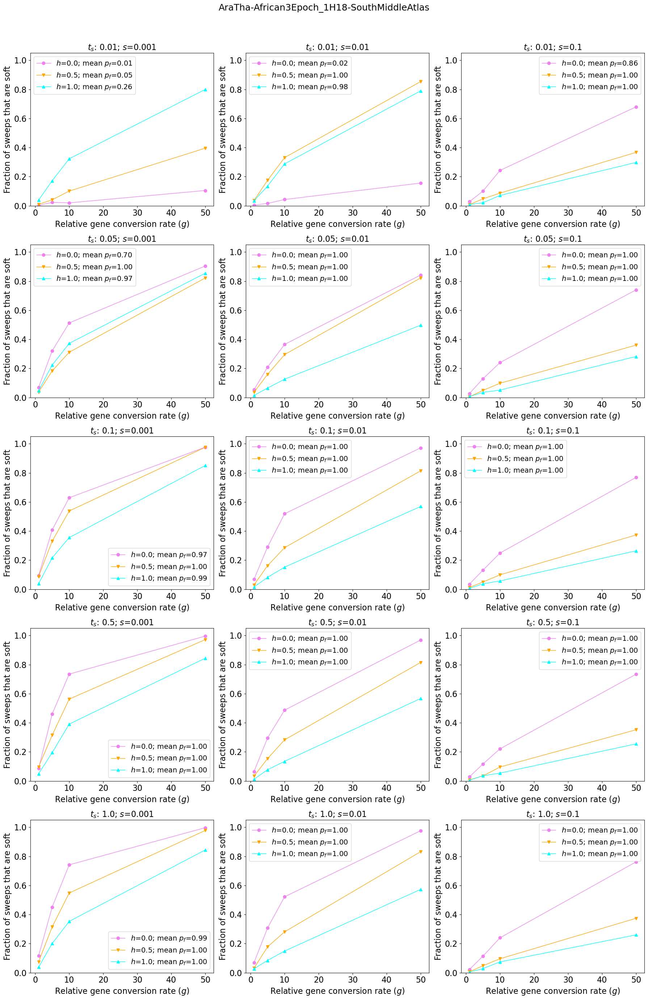

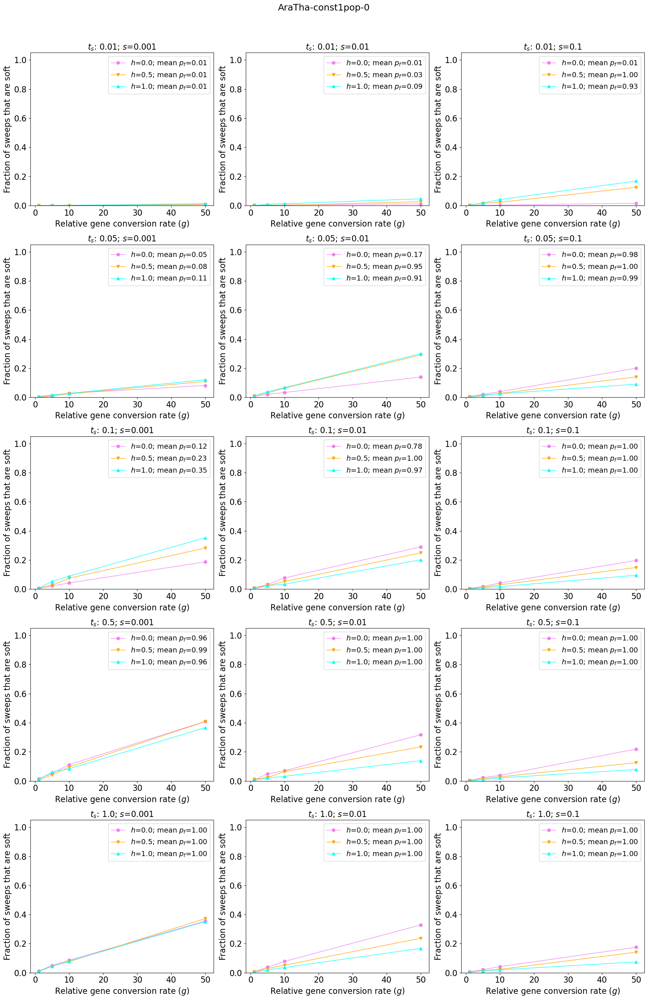

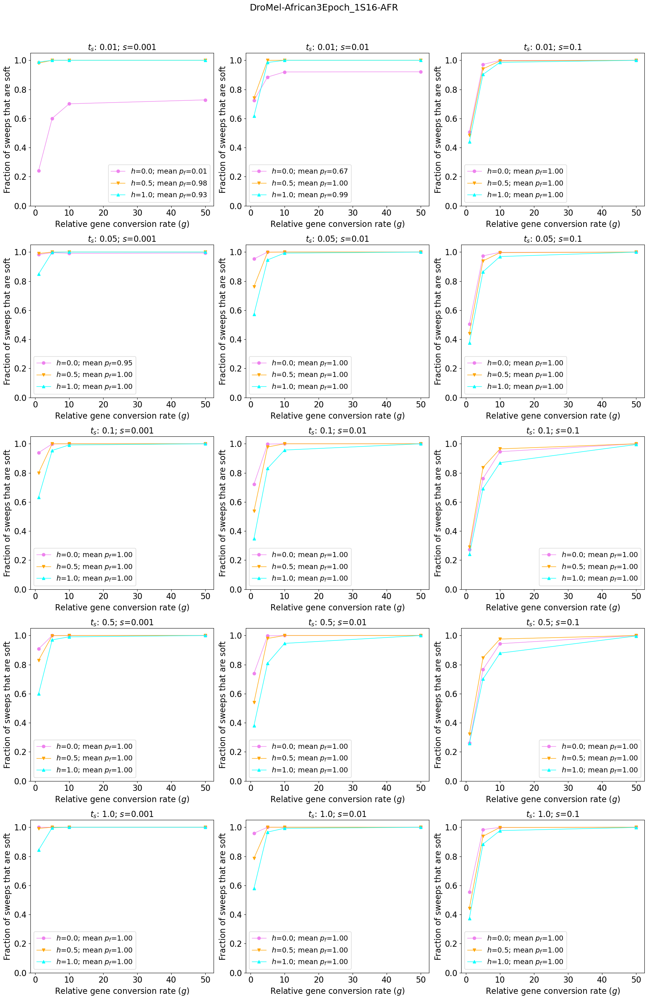

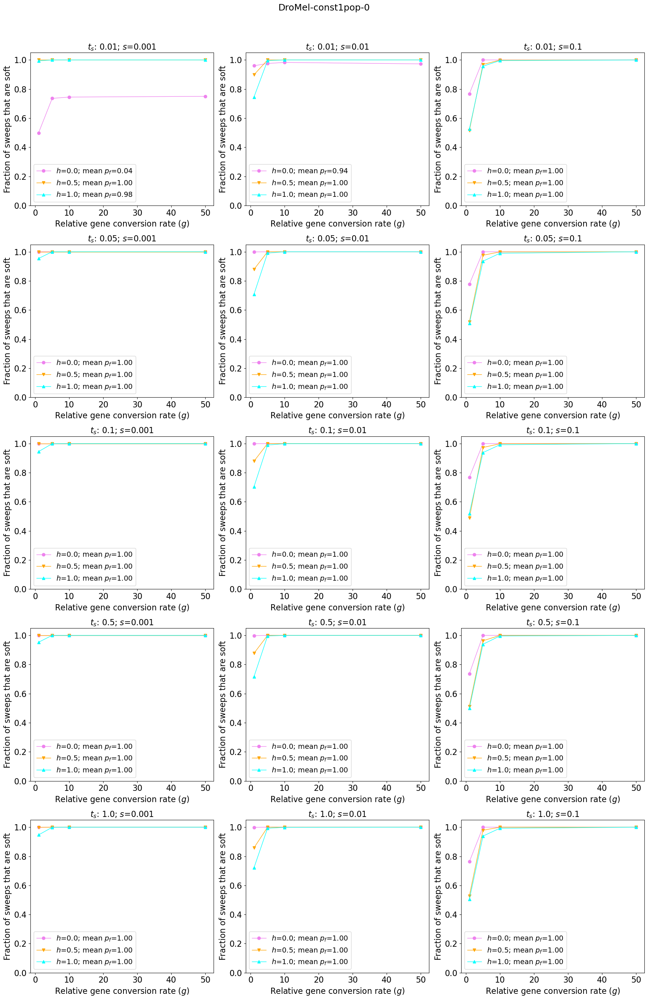

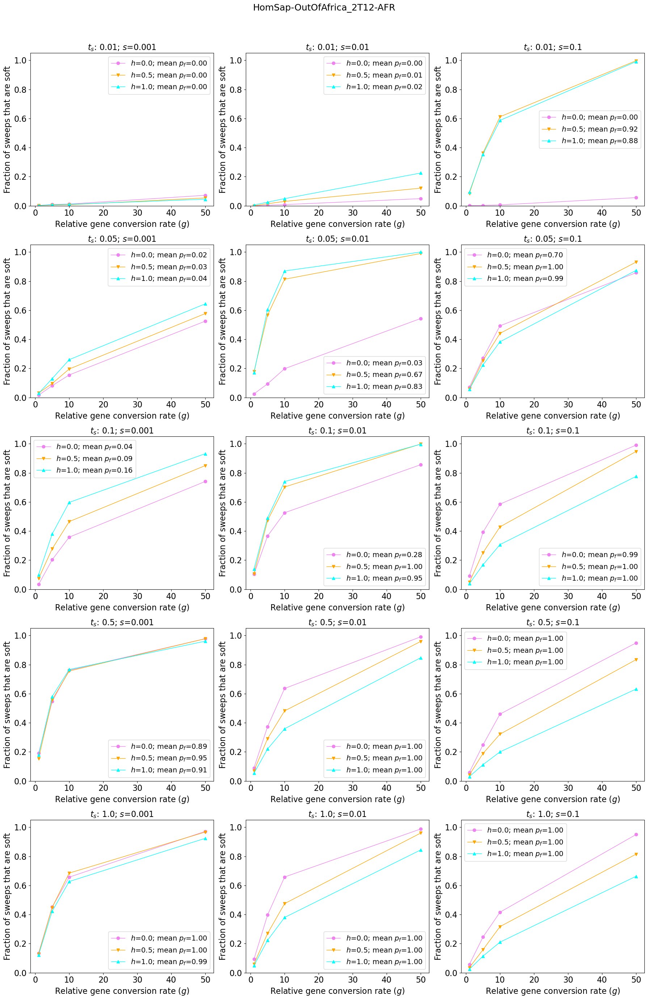

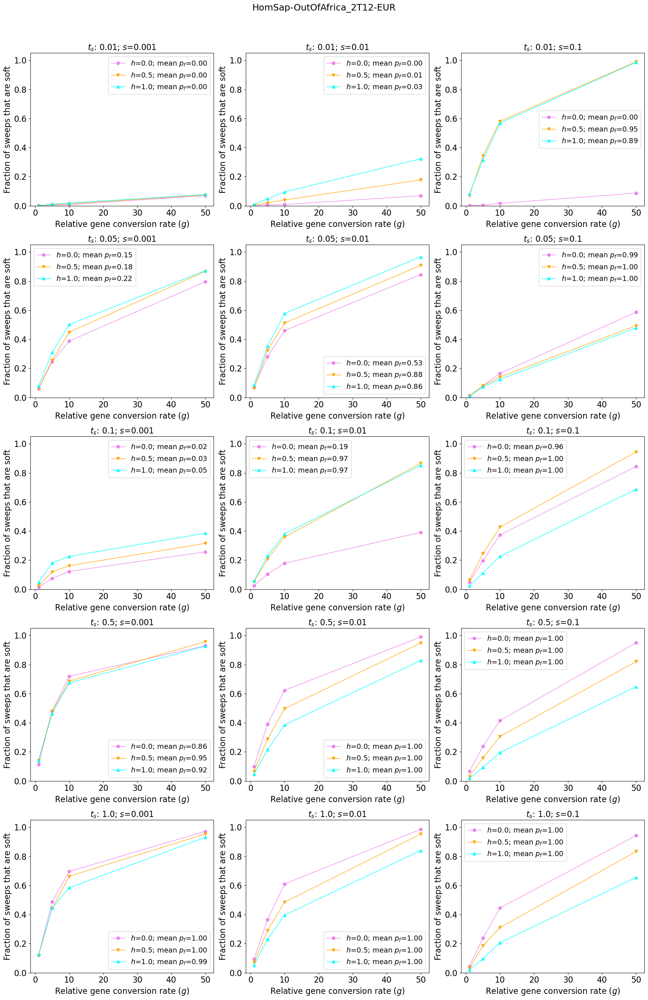

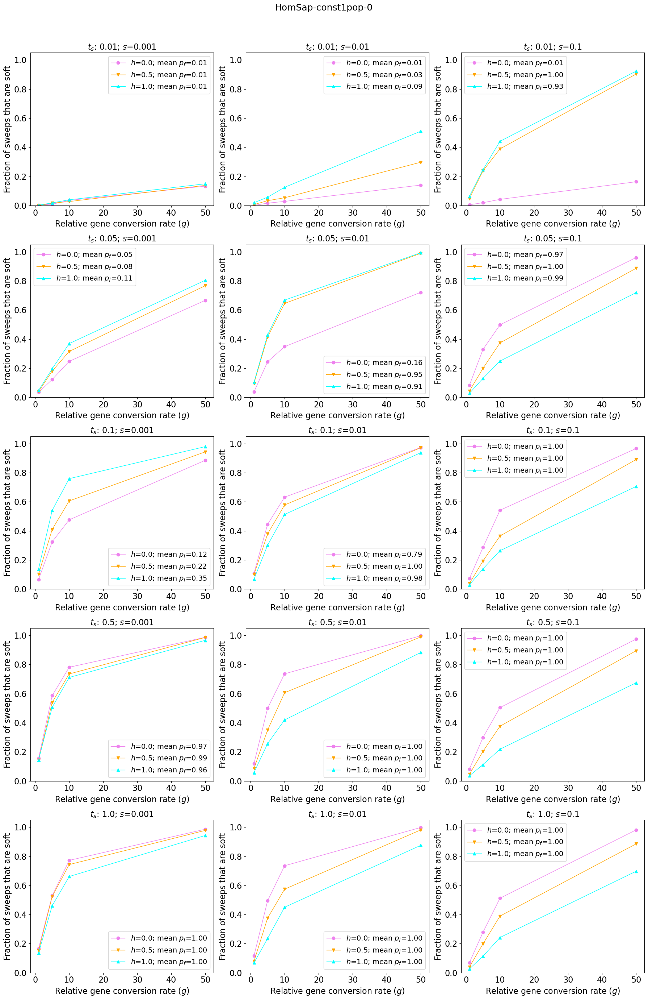

In [3]:
import matplotlib.pyplot as plt

gcRatios = sorted(table['Gene Conversion Ratio'].unique(), key=float)
selCoeffs = sorted(table['Selection Coefficient'].unique(), key=float)
sTimes = sorted(table['Sweep Start Time'].unique(), key=float)

colors = ['violet', 'orange', 'cyan', 'gray', 'brown', 'black', 'red', 'blue']
markers = ['o', 'v', '^', 'x', 's', '+', 'D', '']

for specName, demogModel, targetPop in sorted(allResults):
    table = tables[(specName, demogModel, targetPop)]
    fig, axs = plt.subplots(len(sTimes), len(selCoeffs), figsize=(18, 27))
    title = f"{specName}-{demogModel}-{targetPop}"
    fig.suptitle(title, y=1.02, fontsize=18)
    for i in range(len(sTimes)):
        for j in range(len(selCoeffs)):
            k = 0
            for dom in sorted(table['Dominance Coefficient'].unique(), key=float):
                subTable = table.loc[(table['Sweep Start Time'] == sTimes[i]) & 
                                  (table['Selection Coefficient'] == selCoeffs[j]) & 
                                  (table['Dominance Coefficient'] == dom)]
                softFracs = []
                finalFreqs = []
                noFixes = []
                for gcRatio in gcRatios:
                    currRow = subTable.loc[table['Gene Conversion Ratio'] == gcRatio]
                    fixedSoftFrac = currRow['Fraction Soft in Sample (fixed)'].iloc[0]
                    incompleteSoftFrac = currRow['Fraction Soft in Sample (incomplete)'].iloc[0]
                    noFix = any(currRow['Fixed %'] == "NA")
                    if noFix:
                        softFracs.append(0)
                        noFixes.append(True)
                    else:
                        noFixes.append(False)
                        fixedFrac = float(currRow['Fixed %'].iloc[0])
                        partialFrac = float(currRow['Partial %'].iloc[0])
                        softFrac = 0
                        finalFreq = 0
                        if fixedFrac > 0:
                            softFrac += float(fixedSoftFrac) * fixedFrac
                            finalFreq += 1 * fixedFrac
                        if partialFrac > 0:
                            softFrac += float(incompleteSoftFrac) * partialFrac
                            finalFreq += float(currRow['Mean Sweep Freq in Sample (incomplete)'].iloc[0]) * partialFrac
                        softFracs.append(softFrac)
                        finalFreqs.append(finalFreq)
                domLabel = r"$h$=" + str(dom) + r"; mean $p_f$=" + f"{np.mean(finalFreqs):.2f}"
                axs[i, j].plot(gcRatios[1:], softFracs[1:], color=colors[k], marker=markers[k], lw=1, label=domLabel)
                k += 1
            axs[i, j].legend(fontsize=14)
            axs[i, j].set_title(r"$t_s$:" + f" {sTimes[i]}; " + r"$s$=" + str(selCoeffs[j]), fontsize=16)
            axs[i, j].set_ylim(0, 1.05)
            axs[i, j].set_xlabel('Relative gene conversion rate ' + r"($g$)", fontsize=16)
            axs[i, j].set_ylabel('Fraction of sweeps that are soft', fontsize=16)
            axs[i, j].tick_params(axis='both', labelsize=16)
    fig.tight_layout()
    plt.savefig(f"figs/{title}.pdf")

Now we will examine the oldest sweeps only so that we are looking at sweeps that have reached fixation (or at least gotten REALLY close):

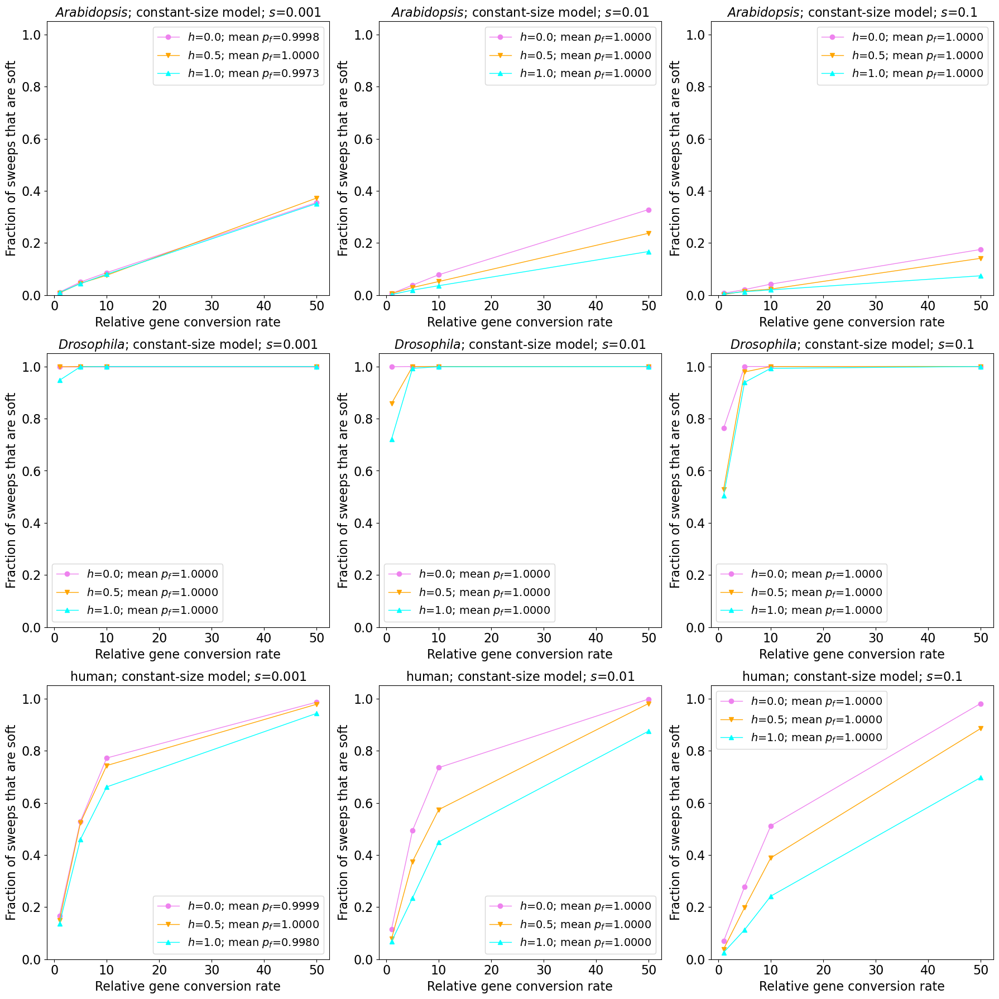

In [4]:
sTimes = sorted(table['Sweep Start Time'].unique(), key=float)
specNames = sorted(set([x[0] for x in allResults]))

def printSpeciesName(specName):
    if specName == "HomSap":
        return "human"
    elif specName == "DroMel":
        return r"$Drosophila$"
    elif specName == "AraTha":
        return r"$Arabidopsis$"

fig, axs = plt.subplots(len(specNames), len(selCoeffs), figsize=(18, 18))
for i in range(len(specNames)):
    specName = specNames[i]
    demogModel = "const1pop"
    targetPop = '0'
    table = tables[(specName, demogModel, targetPop)]
    for j in range(len(selCoeffs)):
        k = 0
        for dom in sorted(table['Dominance Coefficient'].unique(), key=float):
            subTable = table.loc[(table['Sweep Start Time'] == sTimes[-1]) & 
                                 (table['Selection Coefficient'] == selCoeffs[j]) & 
                                 (table['Dominance Coefficient'] == dom)]
            softFracs = []
            finalFreqs = []
            for gcRatio in gcRatios:
                currRow = subTable.loc[table['Gene Conversion Ratio'] == gcRatio]
                fixedSoftFrac = currRow['Fraction Soft in Sample (fixed)'].iloc[0]
                incompleteSoftFrac = currRow['Fraction Soft in Sample (incomplete)'].iloc[0]
                noFix = any(currRow['Fixed %'] == "NA")
                assert not noFix #this would be the case if nothing fixed, but our goal here is to look at things that are fixed or nearly so
                fixedFrac = float(currRow['Fixed %'].iloc[0])
                partialFrac = float(currRow['Partial %'].iloc[0])
                softFrac = 0
                finalFreq = 0
                if fixedFrac > 0:
                    softFrac += float(fixedSoftFrac) * fixedFrac
                    finalFreq += 1 * fixedFrac
                if partialFrac > 0:
                    softFrac += float(incompleteSoftFrac) * partialFrac
                    finalFreq += float(currRow['Mean Sweep Freq in Sample (incomplete)'].iloc[0]) * partialFrac
                softFracs.append(softFrac)
                finalFreqs.append(finalFreq)
            domLabel = r"$h$=" + str(dom) + r"; mean $p_f$=" + f"{np.mean(finalFreqs):.4f}"
            axs[i, j].plot(gcRatios[1:], softFracs[1:], color=colors[k], marker=markers[k], lw=1, label=domLabel)
            k += 1
        axs[i, j].legend(fontsize=14)
        axs[i, j].set_title(f"{printSpeciesName(specName)}; constant-size model; " + r"$s$=" + str(selCoeffs[j]), fontsize=16)
        axs[i, j].set_ylim(0, 1.05)
        axs[i, j].set_xlabel('Relative gene conversion rate', fontsize=16)
        axs[i, j].set_ylabel('Fraction of sweeps that are soft', fontsize=16)
        axs[i, j].tick_params(axis='both', labelsize=16)

fig.tight_layout()
plt.savefig("figs/AllConstSoftFracs.pdf")

## How soft are pseudo-soft sweeps produced by gene conversion?
Now we are going to ask what the final sample frequency of the recombinant haplotype is at the time of sampling, on average, for each parameter combination. We are going to read in our summary files again, but take less information from them this time (just the final frequency of the recombinant haplotype). Let's define a function to do this for us:

In [5]:
def parseRecombFreqsFromSummaryFile(summaryFileName):
    with open(summaryFileName, 'rt') as sf:
        m3FreqsSamp = []
        for line in sf:
            repNum, isGoodRep, isFixed, isFixedSoftPop, m3freqPop, isFixedSoftSamp, m3CountSamp, n, isPartialSoftSamp, \
            m3PartialCountSamp, m3PartialDenomSamp, sojournTime, restartCount = line.strip().split()
            if isGoodRep == "1":
                if isFixed == "1":
                    if int(isFixedSoftSamp):
                        m3Freq = int(m3CountSamp)/int(n)
                        m3FreqsSamp.append(m3Freq)
    return m3FreqsSamp

Now we can read in each summary file, grab the information we need, and make our box plots summarizing the distribution of recombinant haplotype frequencies. We start with just the constant-size demographic models for each species, and limit ourselves to the oldest sweeps (which we know reached fixation in each case).

Yes, there are cleaner ways to do this, but I like to roll my own with dictionaries of dictionaries. Deal with it!

('HomSap', 'const1pop', '0')
['0.001']
0.145 0.17 0.255 0.5851619789347946 0.02970166317632436 0.06433848918053617
['0.01']
0.05 0.035 0.075 0.019856313879564855 0.937074937077839 0.021447663635189455
['0.1']
0.025 0.02 0.0225 0.4739900814432777 0.9329098346508364 0.3925064569417014
('DroMel', 'const1pop', '0')
['0.001']
0.62 0.095 0.09 2.378331798387709e-252 3.408513759631007e-257 0.00040002707515727966
['0.01']
0.155 0.015 0.02 1.1420367264797141e-242 7.255928722817373e-191 1.7345850219376957e-12
['0.1']
0.025 0.005 0.015 3.1726634208874173e-69 1.3192292607400914e-27 2.162856116172807e-23
('AraTha', 'const1pop', '0')
['0.001']
0.13 0.28 0.21000000000000002 0.48237932018065266 0.4806081746787444 1.0
['0.01']
0.045 0.052500000000000005 0.015000000000000001 0.8091970817231279 0.393153437674003 0.14285714285714285
['0.1']
0.015 0.017499999999999998 0.07 0.8811327279279154 0.41267786500815795 0.43444572655277525


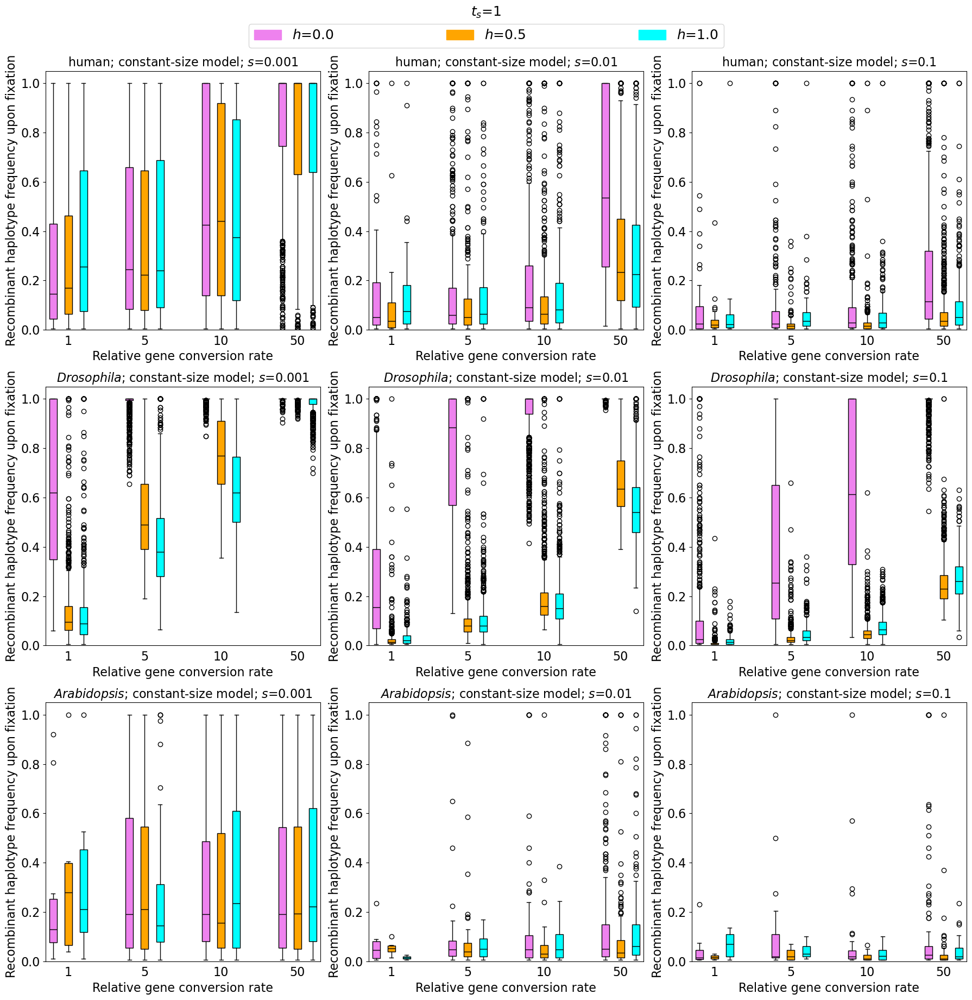

In [6]:
import matplotlib.patches as mpatches

allResults = {}
sTimes, selCoeffs, gcRatios, specNames = {}, {}, {}, {}
for fName in os.listdir(summaryOutDir):
    specName, demogModel, mapName, contigName, targetPop, popNumber, sampleSize, Q, selCoeff, domCoeff, selTime, \
    geneConvRatio = fName.rstrip(".txt").split("-")
    geneConvRatio = int(geneConvRatio)
    
    if geneConvRatio > 0:
        m3FreqsSamp = parseRecombFreqsFromSummaryFile(summaryOutDir + "/" + fName)
        mainKey = (specName, demogModel, targetPop)
        subKey = (selCoeff, selTime)

        
        sTimes[selTime] = 1
        selCoeffs[selCoeff] = 1
        gcRatios[geneConvRatio] = 1
        specNames[specName] = 1
    
        if not mainKey in allResults:
            allResults[mainKey] = {}
        if not subKey in allResults[mainKey]:
            allResults[mainKey][subKey] = {}
        if not domCoeff in allResults[mainKey][subKey]:
            allResults[mainKey][subKey][domCoeff] = {}
        if not geneConvRatio in allResults[mainKey][subKey][domCoeff]:
            allResults[mainKey][subKey][domCoeff][geneConvRatio] = m3FreqsSamp

sTimes = list(sorted(sTimes))
selTime = sTimes[-1]

selCoeffs = list(sorted(selCoeffs, key=float))
gcRatios = list(sorted(gcRatios, key=float))
colors = ['violet', 'orange', 'cyan', 'gray', 'brown', 'black', 'red', 'blue']

positions, pltColors, labelPos = [], [], []
pos = 0
xticklabels = []
for gcRatio in gcRatios:
    for i in range(3):
        positions.append(pos+i+1)
        pltColors.append(colors[i])
    labelPos.append(positions[-2])
    xticklabels += ["",gcRatio,""]
    pos += 5

fig, axs = plt.subplots(len(specNames), len(selCoeffs), figsize=(18, 18))
title = r"$t_s$=" + selTime
fig.suptitle(title, y=1.02, fontsize=18)

def printSpeciesName(specName):
    if specName == "HomSap":
        return "human"
    elif specName == "DroMel":
        return r"$Drosophila$"
    elif specName == "AraTha":
        return r"$Arabidopsis$"

i = 0
for mainKey in reversed(sorted(allResults)):
    specName, demogModel, targetPop = mainKey
    if demogModel == "const1pop":
        print(mainKey)
        for j in range(len(selCoeffs)):
            subKey = (selCoeffs[j], selTime)
            pltData = []
            print([selCoeffs[j]])
            for gcRatio in gcRatios:
                #print([gcRatio])
                recessiveM3Freqs = allResults[mainKey][subKey]['0.0'][gcRatio]
                additiveM3Freqs = allResults[mainKey][subKey]['0.5'][gcRatio]
                dominantM3Freqs = allResults[mainKey][subKey]['1.0'][gcRatio]
                if gcRatio == 1:# and selCoeffs[j] == '0.001':
                    mwU_rec_add, pval_rec_add = scipy.stats.mannwhitneyu(recessiveM3Freqs, additiveM3Freqs)
                    mwU_rec_dom, pval_rec_dom = scipy.stats.mannwhitneyu(recessiveM3Freqs, dominantM3Freqs)
                    mwU_add_dom, pval_add_dom = scipy.stats.mannwhitneyu(additiveM3Freqs, dominantM3Freqs)
                    print(np.median(recessiveM3Freqs), np.median(additiveM3Freqs), np.median(dominantM3Freqs), pval_rec_add, pval_rec_dom, pval_add_dom)
                currData = [recessiveM3Freqs, additiveM3Freqs, dominantM3Freqs]
                currData = [x if x else [0] for x in currData]
                pltData += currData
        
            medianprops = dict(color="black")
            bplot = axs[i, j].boxplot(pltData, positions=positions, notch=False, patch_artist=True, labels=xticklabels, medianprops=medianprops)
            
            for k in range(len(bplot['boxes'])):
                plt.setp(bplot['boxes'][k], facecolor=pltColors[k])
            
            axs[i, j].set_title(f"{printSpeciesName(specName)}; constant-size model; " + r"$s$=" + str(selCoeffs[j]), fontsize=16)
            axs[i, j].set_xlabel('Relative gene conversion rate', fontsize=16)
            axs[i, j].set_ylabel('Recombinant haplotype frequency upon fixation', fontsize=16)
            axs[i, j].tick_params(axis='both', labelsize=16)
            axs[i, j].set_ylim(0, 1.05)
            axs[i, j].set_xticks(labelPos)
            axs[i, j].xaxis.set_ticks_position('none')
            axs[i, j].set_xticklabels(gcRatios)        
        i += 1

handles = [mpatches.Patch(color=pltColors[0], label=r"$h$=0.0"),
           mpatches.Patch(color=pltColors[1], label=r"$h$=0.5"),
           mpatches.Patch(color=pltColors[2], label=r"$h$=1.0")]

fig.legend(handles=handles, loc='lower left', bbox_to_anchor=(0.25, 0.97, 0.5, .101), mode = "expand", ncol = len(handles), fontsize=18)
fig.tight_layout()
plt.savefig(f"figs/softness_allConst_ts1_box.pdf")

Finally, we finish by generating these box plots for each sweep timing for each demographic model for each species:

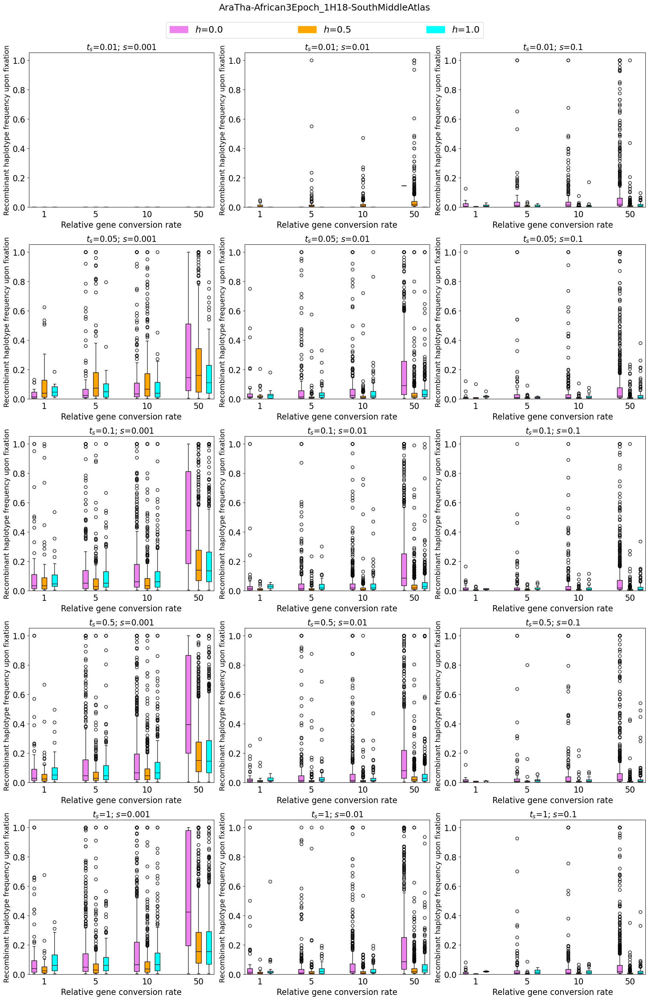

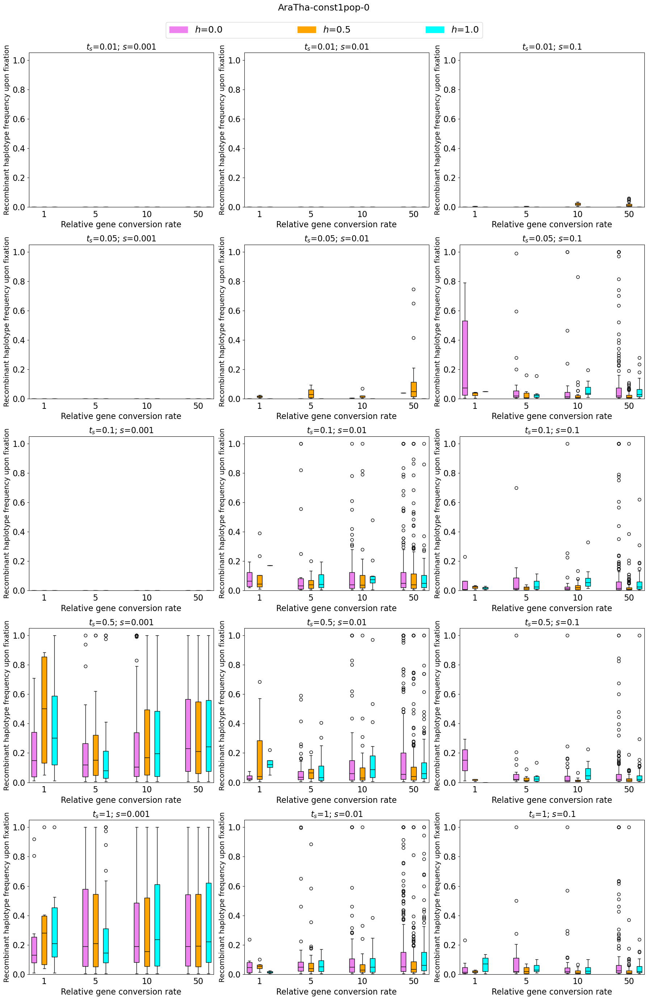

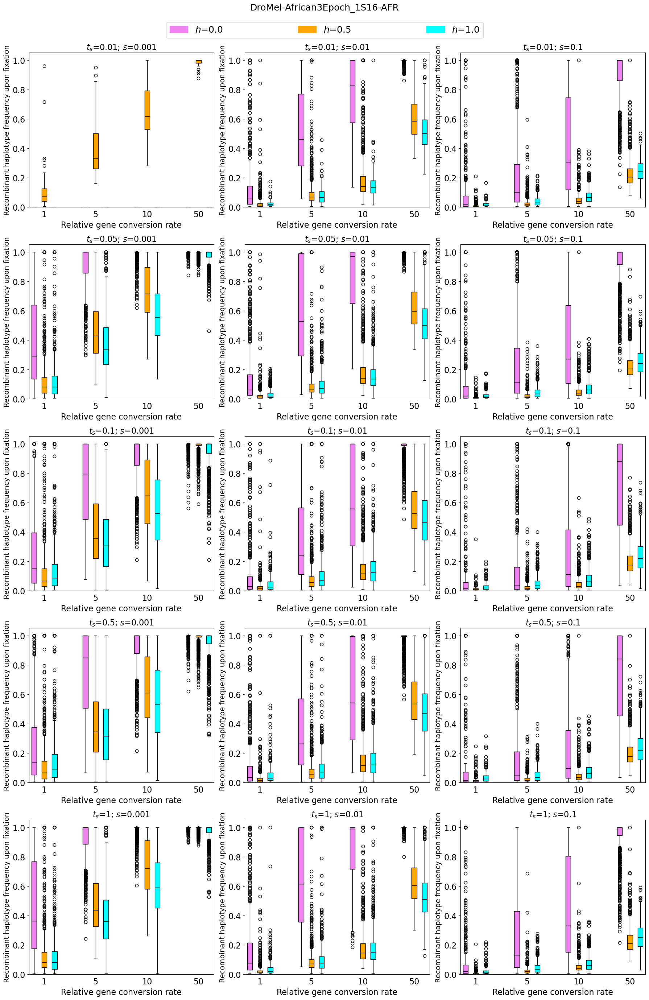

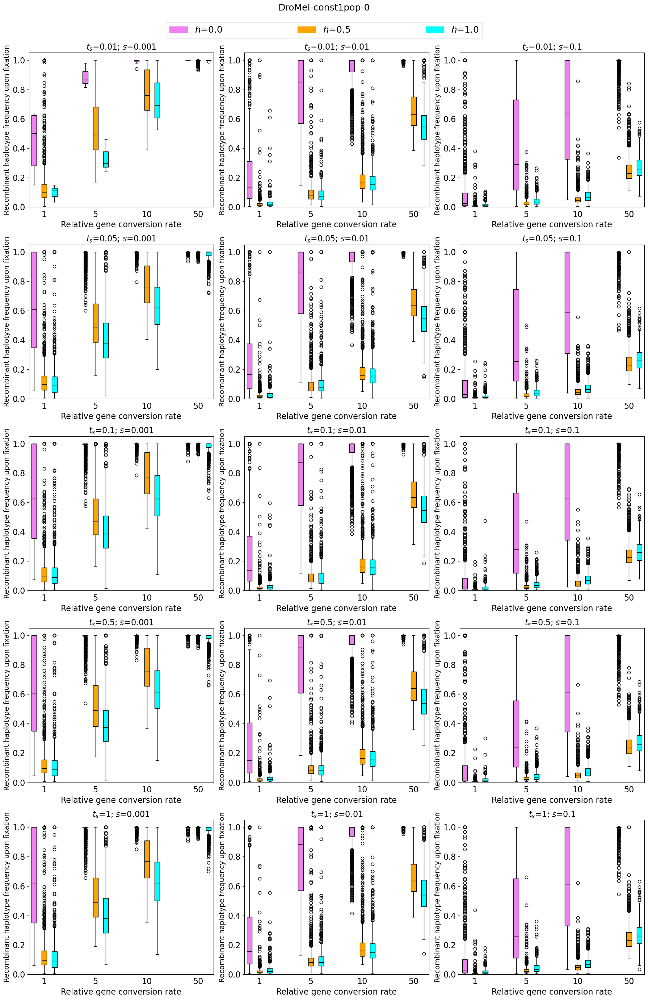

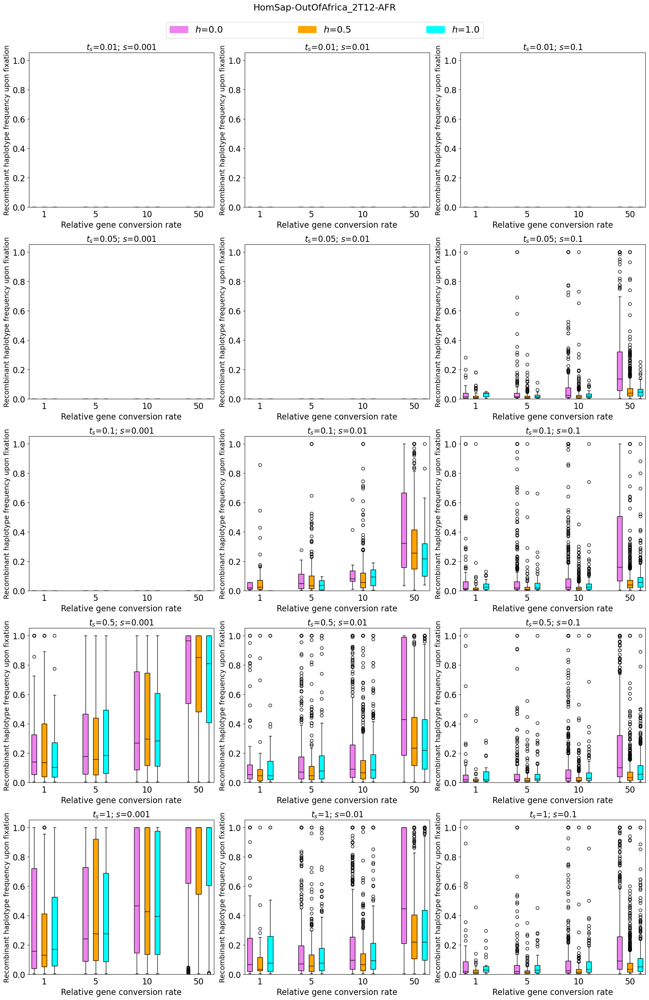

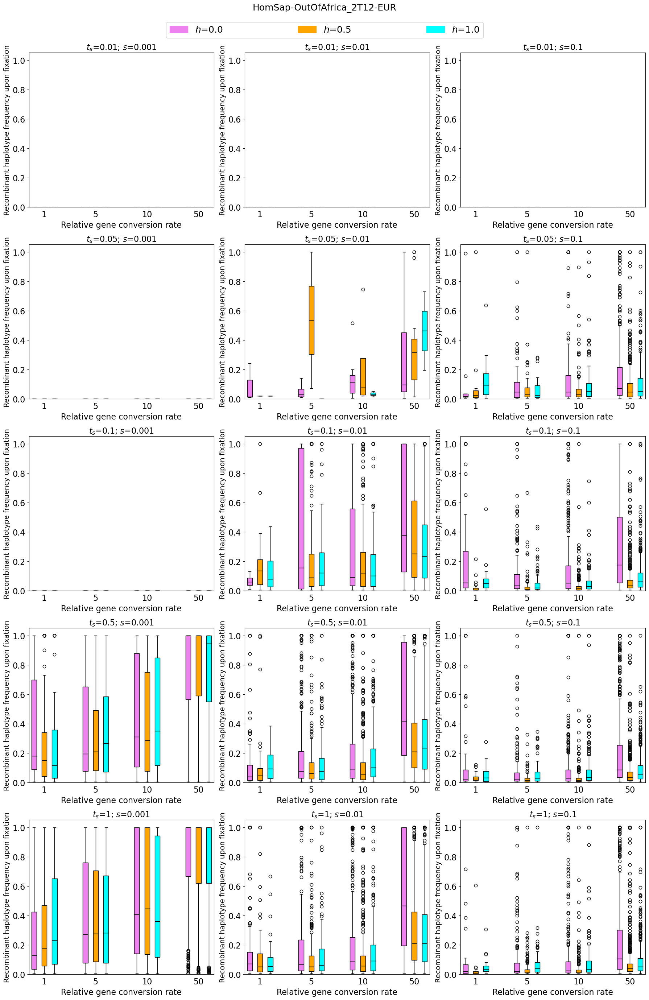

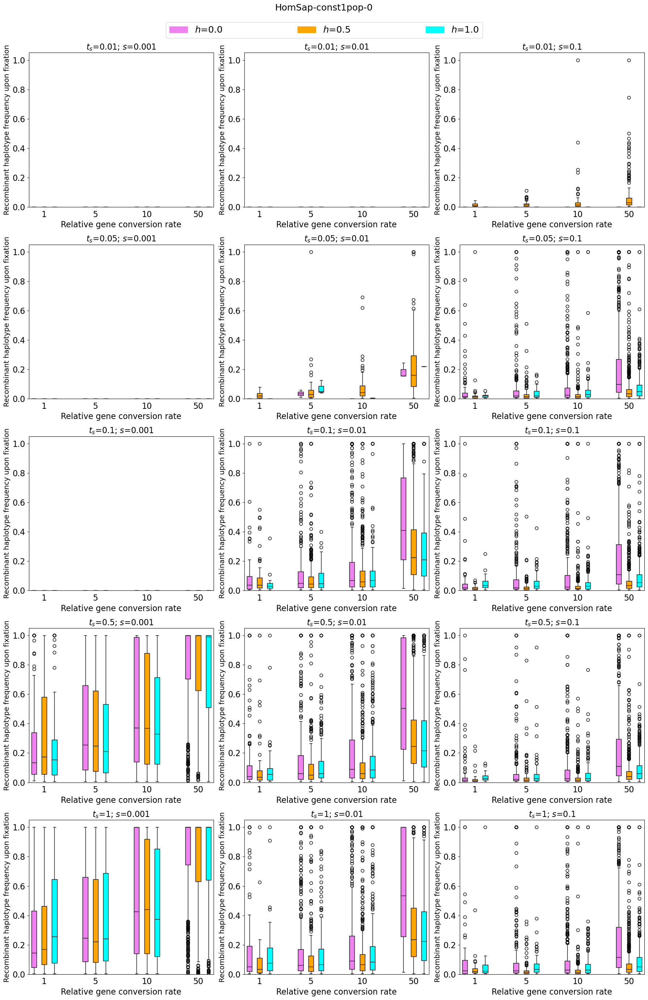

In [7]:
positions, pltColors, labelPos = [], [], []
pos = 0
xticklabels = []
for gcRatio in gcRatios:
    for i in range(3):
        positions.append(pos+i+1)
        pltColors.append(colors[i])
    xticklabels += ["",gcRatio,""]
    labelPos.append(positions[-2])
    pos += 5

for mainKey in sorted(allResults):
    specName, demogModel, targetPop = mainKey
    fig, axs = plt.subplots(len(sTimes), len(selCoeffs), figsize=(18, 27))
    title = f"{specName}-{demogModel}-{targetPop}"
    fig.suptitle(title, y=1.02, fontsize=18)

    for i in range(len(sTimes)):
        for j in range(len(selCoeffs)):
            subKey = (selCoeffs[j], sTimes[i])
            pltData = []
            for gcRatio in gcRatios:
                recessiveM3Freqs = allResults[mainKey][subKey]['0.0'][gcRatio]
                additiveM3Freqs = allResults[mainKey][subKey]['0.5'][gcRatio]
                dominantM3Freqs = allResults[mainKey][subKey]['1.0'][gcRatio]
                currData = [recessiveM3Freqs, additiveM3Freqs, dominantM3Freqs]
                currData = [x if x else [0] for x in currData]
                pltData += currData


            boxplot = axs[i, j].boxplot(pltData, positions=positions, notch=False, patch_artist=True, labels=xticklabels, medianprops=medianprops)
            for k in range(len(boxplot['boxes'])):
                plt.setp(boxplot['boxes'][k], facecolor=pltColors[k])
            
            axs[i, j].set_title(r"$t_s$=" + f"{sTimes[i]}; " + r"$s$=" + str(selCoeffs[j]), fontsize=16)
            axs[i, j].set_xlabel('Relative gene conversion rate', fontsize=16)
            axs[i, j].set_ylabel('Recombinant haplotype frequency upon fixation', fontsize=14)
            axs[i, j].tick_params(axis='both', labelsize=16)
            axs[i, j].set_ylim(0, 1.05)
            axs[i, j].set_xticks(labelPos)
            axs[i, j].xaxis.set_ticks_position('none')
            axs[i, j].set_xticklabels(gcRatios)

    handles = [mpatches.Patch(color=pltColors[0], label=r"$h$=0.0"),
               mpatches.Patch(color=pltColors[1], label=r"$h$=0.5"),
               mpatches.Patch(color=pltColors[2], label=r"$h$=1.0")]

    fig.legend(handles=handles, loc='lower left', bbox_to_anchor=(0.25, 0.98, 0.5, .102), mode = "expand", ncol = len(handles), fontsize=18)
    fig.tight_layout()
    plt.savefig(f"figs/softness_{title}_box.pdf")

That's it! If you ran through the whole simulation/paring pipeline laid out in the README before running this notebook you should now have the figures saved as pdf files located in a directory called `figs`.